In [1]:
import numpy as np
import pandas as pd

data_s = pd.read_excel('Data/NIR/agro_2009_2018_data.xlsx', index_col=0)
data_harvest = pd.read_excel('Data/NIR/agro_harvest.xlsx', index_col=0)
data_tech = pd.read_excel('Data/NIR/agro_tech.xls', index_col=0)
data_s.head(3)

,Регион,Тип хозяйства,Год,С/х культура,"Посевная площадь, Га"
1,Российская Федерация,Крестьянские (фермерские) хозяйства и индивиду...,2009,Бахчевые продовольственные культуры,78.42
2,Российская Федерация,Крестьянские (фермерские) хозяйства и индивиду...,2009,Вся посевная площадь,15848.67
3,Российская Федерация,Крестьянские (фермерские) хозяйства и индивиду...,2009,Горох,134.02


In [2]:
data_s.shape

(103622, 5)

In [3]:
data_s['Тип хозяйства'].unique()

array(['Крестьянские (фермерские) хозяйства и индивидуальные предприниматели',
       'Сельскохозяйственные организации (все сельхозпредприятия)',
       'Хозяйства всех категорий', 'Хозяйства населения(граждане)'],
      dtype=object)

In [4]:
data_s.dtypes

Регион                   object
Тип хозяйства            object
Год                       int64
С/х культура             object
Посевная площадь, Га    float64
dtype: object

In [5]:
# Проверка на пустые значения
data_s.isnull().sum()

Регион                  0
Тип хозяйства           0
Год                     0
С/х культура            0
Посевная площадь, Га    0
dtype: int64

In [6]:
data_harvest.head(3)
#data_harvest['Хозяйства'].unique()

,Регион,Год,Хозяйства,С/х культура,Размерность,"Урожайность, ц с Га"
№,,,,,,
1.0,Российская Федерация,2009,Крестьянские (фермерские) хозяйства и индивиду...,Бахчевые продовольственные культуры,центнеров с гектара,73.8
2.0,Российская Федерация,2009,Крестьянские (фермерские) хозяйства и индивиду...,Виноградные насаждения,центнеров с гектара,59.9
3.0,Российская Федерация,2009,Крестьянские (фермерские) хозяйства и индивиду...,Горох,центнеров с гектара,15.6


In [7]:
data_harvest.dtypes

Регион                  object
Год                      int64
Хозяйства               object
С/х культура            object
Размерность             object
Урожайность, ц с Га    float64
dtype: object

In [8]:
data_tech.head(3)

,Регион,Организации,Год,Вид с/х техники,ед. учета,Количество
№,,,,,,
1.0,Российская Федерация,Сельскохозяйственные организации (все сельхозп...,2009,Бороны,штука,1087993
2.0,Российская Федерация,Сельскохозяйственные организации (все сельхозп...,2009,"Всего тракторов (без тракторов, на которых смо...",штука,329980
3.0,Российская Федерация,Сельскохозяйственные организации (все сельхозп...,2009,Грабли тракторные,штука,20379


In [9]:
data_tech['Организации'].unique()

array(['Сельскохозяйственные организации (все сельхозпредприятия)',
       'Сельхозорганизации крупные и средние (тип 2,3)',
       'Сельхозорганизации,крупные,средние и малые'], dtype=object)

In [10]:
new_df = pd.merge(data_s, data_harvest,  how='inner', left_on=['Регион','Год','С/х культура','Тип хозяйства'], right_on = ['Регион','Год', 'С/х культура','Хозяйства'])

In [11]:
new_df.head(3)

,Регион,Тип хозяйства,Год,С/х культура,"Посевная площадь, Га",Хозяйства,Размерность,"Урожайность, ц с Га"
0,Российская Федерация,Крестьянские (фермерские) хозяйства и индивиду...,2009,Бахчевые продовольственные культуры,78.42,Крестьянские (фермерские) хозяйства и индивиду...,центнеров с гектара,73.8
1,Российская Федерация,Крестьянские (фермерские) хозяйства и индивиду...,2009,Горох,134.02,Крестьянские (фермерские) хозяйства и индивиду...,центнеров с гектара,15.6
2,Российская Федерация,Крестьянские (фермерские) хозяйства и индивиду...,2009,Горчица,22.76,Крестьянские (фермерские) хозяйства и индивиду...,центнеров с гектара,4.3


In [12]:
del new_df['Хозяйства']
del new_df['Размерность']

In [13]:
new_df['С/х культура'].unique()

array(['Бахчевые продовольственные культуры', 'Горох', 'Горчица',
       'Гречиха', 'Зернобобовые культуры',
       'Зерновые и зернобобовые культуры', 'Картофель - всего',
       'Конопля среднерусская - в переводе на волокно',
       'Кормовые корнеплоды (включая сахарную свеклу на корм скоту)',
       'Кукуруза на зерно',
       'Кукуруза на силос, зеленый корм и сенаж (вес зеленой массы)',
       'Лен долгунец - в переводе на волокно', 'Лен кудряш(масличный)',
       'Масличные культуры', 'Овес', 'Овощи открытого грунта',
       'Озимые зерновые культуры', 'Подсолнечник', 'Просо',
       'Пшеница озимая', 'Пшеница озимая и яровая', 'Пшеница яровая',
       'Рапс', 'Рапс озимый', 'Рапс яровой-кольза', 'Рис', 'Рожь озимая',
       'Рожь озимая и яровая', 'Рожь яровая', 'Рыжик', 'Сахарная свекла',
       'Сорго', 'Соя', 'Тритикале',
       'Яровые зерновые и зернобобовые культуры', 'Ячмень озимый',
       'Ячмень озимый и яровой', 'Ячмень яровой'], dtype=object)

In [14]:
new_df.head(3)

,Регион,Тип хозяйства,Год,С/х культура,"Посевная площадь, Га","Урожайность, ц с Га"
0,Российская Федерация,Крестьянские (фермерские) хозяйства и индивиду...,2009,Бахчевые продовольственные культуры,78.42,73.8
1,Российская Федерация,Крестьянские (фермерские) хозяйства и индивиду...,2009,Горох,134.02,15.6
2,Российская Федерация,Крестьянские (фермерские) хозяйства и индивиду...,2009,Горчица,22.76,4.3


In [15]:
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')

statist_df_potato = new_df[(new_df['Тип хозяйства']=='Хозяйства всех категорий') & (new_df['С/х культура']=='Картофель - всего')
                  & (new_df['Регион']=='Российская Федерация')]
statist_df_potato.plot(
    y=['Посевная площадь, Га','Урожайность, ц с Га'],x='Год',title="Посевные площади  и урожайность картофеля с 2009 по 2018")

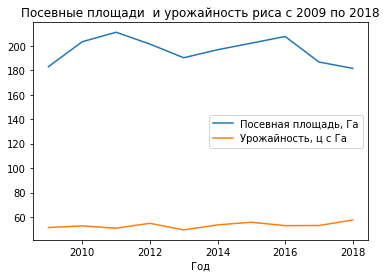

In [16]:
statist_df_ris = new_df[(new_df['Тип хозяйства']=='Хозяйства всех категорий') & (new_df['С/х культура']=='Рис')
                  & (new_df['Регион']=='Российская Федерация')]

statist_df_ris.plot(
    y=['Посевная площадь, Га','Урожайность, ц с Га'],x='Год',title="Посевные площади  и урожайность риса с 2009 по 2018")

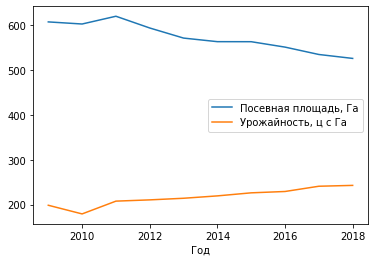

In [17]:
statist_df_vegetable = new_df[(new_df['Тип хозяйства']=='Хозяйства всех категорий') & (new_df['С/х культура']=='Овощи открытого грунта')
                  & (new_df['Регион']=='Российская Федерация')]

statist_df_vegetable.plot(y=['Посевная площадь, Га','Урожайность, ц с Га'],x='Год')

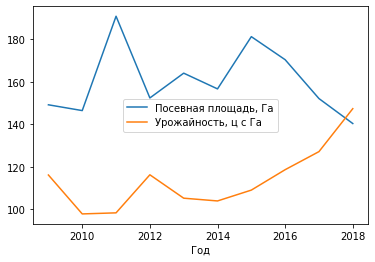

In [18]:
statist_df_bahcha = new_df[(new_df['Тип хозяйства']=='Хозяйства всех категорий') & (new_df['С/х культура']=='Бахчевые продовольственные культуры')
                  & (new_df['Регион']=='Российская Федерация')]

statist_df_bahcha.plot(y=['Посевная площадь, Га','Урожайность, ц с Га'],x='Год')

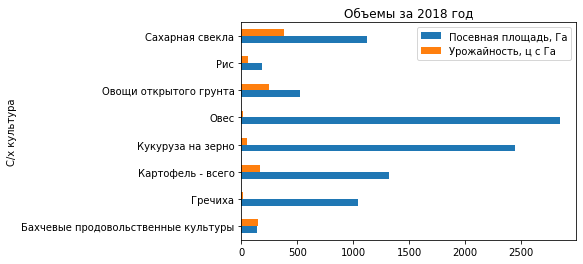

In [29]:
statist_df_all = new_df[(new_df['Тип хозяйства']=='Хозяйства всех категорий') & (new_df['Год']==2018)
                  & (new_df['Регион']=='Российская Федерация')
                       & ((new_df['С/х культура']=='Овощи открытого грунта') | (new_df['С/х культура']=='Рис') |
                          (new_df['С/х культура']=='Гречиха') | (new_df['С/х культура']=='Овес') |
                         (new_df['С/х культура']=='Картофель - всего') | 
                          (new_df['С/х культура']=='Бахчевые продовольственные культуры') |
                          (new_df['С/х культура']=='Сахарная свекла') |
                         (new_df['С/х культура']=='Кукуруза на зерно'))]

statist_df_all.plot.barh (y = ['Посевная площадь, Га','Урожайность, ц с Га'], x = 'С/х культура',
                          title='Объемы за 2018 год')
# statist_df_all.plot(y=['Посевная площадь, Га','Урожайность, ц с Га'],x='С/х культура')

In [30]:
new_df['Регион'].value_counts()

    Сибирский федеральный округ                                                            1505
Российская Федерация                                                                       1266
Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)    1266
    Центральный федеральный округ                                                          1210
    Приволжский федеральный округ                                                          1209
    Северо-Кавказский федеральный округ                                                    1179
        Ростовская область                                                                 1153
        Краснодарский край                                                                 1150
    Дальневосточный федеральный округ                                                      1117
        Воронежская область                                                                1117
        Ставропольский край             

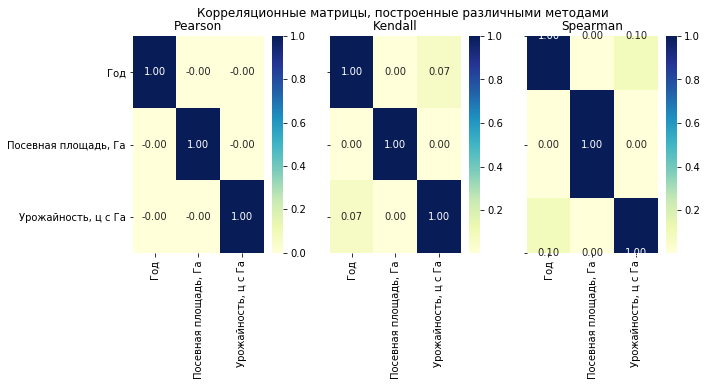

In [31]:
import seaborn as sb

fig, ax = plt.subplots(1, 3, sharex='col', sharey='row', figsize=(10,4))
sb.heatmap(new_df.corr(method='pearson'), ax=ax[0], cmap='YlGnBu', annot=True, fmt='.2f')
sb.heatmap(new_df.corr(method='kendall'), ax=ax[1],cmap='YlGnBu', annot=True, fmt='.2f')
sb.heatmap(new_df.corr(method='spearman'), ax=ax[2], cmap='YlGnBu', annot=True, fmt='.2f')
fig.suptitle('Корреляционные матрицы, построенные различными методами')
ax[0].title.set_text('Pearson')
ax[1].title.set_text('Kendall')
ax[2].title.set_text('Spearman')

TypeError: Could not convert Российская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская ФедерацияРоссийская Федерация    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ    Центральный федеральный округ        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Белгородская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Брянская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Владимирская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Воронежская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Ивановская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Калужская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Костромская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Курская область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Липецкая область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Московская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Орловская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Рязанская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Смоленская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тамбовская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тверская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Тульская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Ярославская область        Город Москва столица Российской Федерации город федерального значения        Город Москва столица Российской Федерации город федерального значения        Город Москва столица Российской Федерации город федерального значения        Город Москва столица Российской Федерации город федерального значения        Город Москва столица Российской Федерации город федерального значения        Город Москва столица Российской Федерации город федерального значения        Город Москва столица Российской Федерации город федерального значения        Город Москва столица Российской Федерации город федерального значения        Город Москва столица Российской Федерации город федерального значения        Город Москва столица Российской Федерации город федерального значения        Город Москва столица Российской Федерации город федерального значения        Город Москва столица Российской Федерации город федерального значения        Город Москва столица Российской Федерации город федерального значения        Город Москва столица Российской Федерации город федерального значения        Город Москва столица Российской Федерации город федерального значения        Город Москва столица Российской Федерации город федерального значения        Город Москва столица Российской Федерации город федерального значения        Город Москва столица Российской Федерации город федерального значения        Город Москва столица Российской Федерации город федерального значения        Город Москва столица Российской Федерации город федерального значения        Город Москва столица Российской Федерации город федерального значения        Город Москва столица Российской Федерации город федерального значения        Город Москва столица Российской Федерации город федерального значения        Город Москва столица Российской Федерации город федерального значения        Город Москва столица Российской Федерации город федерального значения        Город Москва столица Российской Федерации город федерального значения        Город Москва столица Российской Федерации город федерального значения        Город Москва столица Российской Федерации город федерального значения        Город Москва столица Российской Федерации город федерального значения        Город Москва столица Российской Федерации город федерального значения        Город Москва столица Российской Федерации город федерального значения        Город Москва столица Российской Федерации город федерального значения        Город Москва столица Российской Федерации город федерального значения        Город Москва столица Российской Федерации город федерального значения        Город Москва столица Российской Федерации город федерального значения        Город Москва столица Российской Федерации город федерального значения        Город Москва столица Российской Федерации город федерального значения        Город Москва столица Российской Федерации город федерального значения        Город Москва столица Российской Федерации город федерального значения        Город Москва столица Российской Федерации город федерального значения        Город Москва столица Российской Федерации город федерального значения        Город Москва столица Российской Федерации город федерального значения        Город Москва столица Российской Федерации город федерального значения        Город Москва столица Российской Федерации город федерального значения        Город Москва столица Российской Федерации город федерального значения        Город Москва столица Российской Федерации город федерального значения        Город Москва столица Российской Федерации город федерального значения        Город Москва столица Российской Федерации город федерального значения        Город Москва столица Российской Федерации город федерального значения        Город Москва столица Российской Федерации город федерального значения        Город Москва столица Российской Федерации город федерального значения        Город Москва столица Российской Федерации город федерального значения        Город Москва столица Российской Федерации город федерального значения        Город Москва столица Российской Федерации город федерального значения        Город Москва столица Российской Федерации город федерального значения        Город Москва столица Российской Федерации город федерального значения        Город Москва столица Российской Федерации город федерального значения        Город Москва столица Российской Федерации город федерального значения        Город Москва столица Российской Федерации город федерального значения        Город Москва столица Российской Федерации город федерального значения        Город Москва столица Российской Федерации город федерального значения        Город Москва столица Российской Федерации город федерального значения        Город Москва столица Российской Федерации город федерального значения        Город Москва столица Российской Федерации город федерального значения        Город Москва столица Российской Федерации город федерального значения        Город Москва столица Российской Федерации город федерального значения        Город Москва столица Российской Федерации город федерального значения        Город Москва столица Российской Федерации город федерального значения        Город Москва столица Российской Федерации город федерального значения        Город Москва столица Российской Федерации город федерального значения        Город Москва столица Российской Федерации город федерального значения        Город Москва столица Российской Федерации город федерального значения        Город Москва столица Российской Федерации город федерального значения        Город Москва столица Российской Федерации город федерального значения        Город Москва столица Российской Федерации город федерального значения        Город Москва столица Российской Федерации город федерального значения        Город Москва столица Российской Федерации город федерального значения        Город Москва столица Российской Федерации город федерального значения        Город Москва столица Российской Федерации город федерального значения        Город Москва столица Российской Федерации город федерального значения        Город Москва столица Российской Федерации город федерального значения        Город Москва столица Российской Федерации город федерального значения        Город Москва столица Российской Федерации город федерального значения        Город Москва столица Российской Федерации город федерального значения        Город Москва столица Российской Федерации город федерального значения        Город Москва столица Российской Федерации город федерального значения        Город Москва столица Российской Федерации город федерального значения        Город Москва столица Российской Федерации город федерального значения        Город Москва столица Российской Федерации город федерального значения        Город Москва столица Российской Федерации город федерального значения        Город Москва столица Российской Федерации город федерального значения        Город Москва столица Российской Федерации город федерального значения        Город Москва столица Российской Федерации город федерального значения        Город Москва столица Российской Федерации город федерального значения        Город Москва столица Российской Федерации город федерального значения        Город Москва столица Российской Федерации город федерального значения        Город Москва столица Российской Федерации город федерального значения        Город Москва столица Российской Федерации город федерального значения        Город Москва столица Российской Федерации город федерального значения        Город Москва столица Российской Федерации город федерального значения        Город Москва столица Российской Федерации город федерального значения        Город Москва столица Российской Федерации город федерального значения        Город Москва столица Российской Федерации город федерального значения        Город Москва столица Российской Федерации город федерального значения        Город Москва столица Российской Федерации город федерального значения        Город Москва столица Российской Федерации город федерального значения        Город Москва столица Российской Федерации город федерального значения        Город Москва столица Российской Федерации город федерального значения        Город Москва столица Российской Федерации город федерального значения        Город Москва столица Российской Федерации город федерального значения        Город Москва столица Российской Федерации город федерального значения        Город Москва столица Российской Федерации город федерального значения        Город Москва столица Российской Федерации город федерального значения        Город Москва столица Российской Федерации город федерального значения        Город Москва столица Российской Федерации город федерального значения        Город Москва столица Российской Федерации город федерального значения        Город Москва столица Российской Федерации город федерального значения        Город Москва столица Российской Федерации город федерального значения        Город Москва столица Российской Федерации город федерального значения        Город Москва столица Российской Федерации город федерального значения        Город Москва столица Российской Федерации город федерального значения        Город Москва столица Российской Федерации город федерального значения        Город Москва столица Российской Федерации город федерального значения        Город Москва столица Российской Федерации город федерального значения        Город Москва столица Российской Федерации город федерального значения        Город Москва столица Российской Федерации город федерального значения        Город Москва столица Российской Федерации город федерального значения        Город Москва столица Российской Федерации город федерального значения        Город Москва столица Российской Федерации город федерального значения        Город Москва столица Российской Федерации город федерального значения        Город Москва столица Российской Федерации город федерального значения        Город Москва столица Российской Федерации город федерального значения        Город Москва столица Российской Федерации город федерального значения        Город Москва столица Российской Федерации город федерального значения        Город Москва столица Российской Федерации город федерального значения        Город Москва столица Российской Федерации город федерального значения        Город Москва столица Российской Федерации город федерального значения        Город Москва столица Российской Федерации город федерального значения        Город Москва столица Российской Федерации город федерального значения        Город Москва столица Российской Федерации город федерального значения        Город Москва столица Российской Федерации город федерального значения        Город Москва столица Российской Федерации город федерального значения        Город Москва столица Российской Федерации город федерального значения        Город Москва столица Российской Федерации город федерального значения        Город Москва столица Российской Федерации город федерального значения        Город Москва столица Российской Федерации город федерального значения        Город Москва столица Российской Федерации город федерального значения        Город Москва столица Российской Федерации город федерального значения        Город Москва столица Российской Федерации город федерального значения        Город Москва столица Российской Федерации город федерального значения        Город Москва столица Российской Федерации город федерального значения        Город Москва столица Российской Федерации город федерального значения        Город Москва столица Российской Федерации город федерального значения        Город Москва столица Российской Федерации город федерального значения        Город Москва столица Российской Федерации город федерального значения        Город Москва столица Российской Федерации город федерального значения        Город Москва столица Российской Федерации город федерального значения        Город Москва столица Российской Федерации город федерального значения        Город Москва столица Российской Федерации город федерального значения        Город Москва столица Российской Федерации город федерального значения        Город Москва столица Российской Федерации город федерального значения        Город Москва столица Российской Федерации город федерального значения        Город Москва столица Российской Федерации город федерального значения        Город Москва столица Российской Федерации город федерального значения        Город Москва столица Российской Федерации город федерального значения        Город Москва столица Российской Федерации город федерального значения        Город Москва столица Российской Федерации город федерального значения        Город Москва столица Российской Федерации город федерального значения        Город Москва столица Российской Федерации город федерального значения        Город Москва столица Российской Федерации город федерального значения        Город Москва столица Российской Федерации город федерального значения        Город Москва столица Российской Федерации город федерального значения        Город Москва столица Российской Федерации город федерального значения        Город Москва столица Российской Федерации город федерального значения        Город Москва столица Российской Федерации город федерального значения        Город Москва столица Российской Федерации город федерального значения        Город Москва столица Российской Федерации город федерального значения        Город Москва столица Российской Федерации город федерального значения        Город Москва столица Российской Федерации город федерального значения        Город Москва столица Российской Федерации город федерального значения        Город Москва столица Российской Федерации город федерального значения        Город Москва столица Российской Федерации город федерального значения        Город Москва столица Российской Федерации город федерального значения        Город Москва столица Российской Федерации город федерального значения        Город Москва столица Российской Федерации город федерального значения        Город Москва столица Российской Федерации город федерального значения        Город Москва столица Российской Федерации город федерального значения        Город Москва столица Российской Федерации город федерального значения        Город Москва столица Российской Федерации город федерального значения        Город Москва столица Российской Федерации город федерального значения        Город Москва столица Российской Федерации город федерального значения        Город Москва столица Российской Федерации город федерального значения        Город Москва столица Российской Федерации город федерального значения        Город Москва столица Российской Федерации город федерального значения        Город Москва столица Российской Федерации город федерального значения        Город Москва столица Российской Федерации город федерального значения        Город Москва столица Российской Федерации город федерального значения        Город Москва столица Российской Федерации город федерального значения        Город Москва столица Российской Федерации город федерального значения        Город Москва столица Российской Федерации город федерального значения        Город Москва столица Российской Федерации город федерального значения        Город Москва столица Российской Федерации город федерального значения        Город Москва столица Российской Федерации город федерального значения        Город Москва столица Российской Федерации город федерального значения        Город Москва столица Российской Федерации город федерального значения        Город Москва столица Российской Федерации город федерального значения        Город Москва столица Российской Федерации город федерального значения        Город Москва столица Российской Федерации город федерального значения        Город Москва столица Российской Федерации город федерального значения        Город Москва столица Российской Федерации город федерального значения        Город Москва столица Российской Федерации город федерального значения        Город Москва столица Российской Федерации город федерального значения        Город Москва столица Российской Федерации город федерального значения        Город Москва столица Российской Федерации город федерального значения        Город Москва столица Российской Федерации город федерального значения        Город Москва столица Российской Федерации город федерального значения        Город Москва столица Российской Федерации город федерального значения        Город Москва столица Российской Федерации город федерального значения        Город Москва столица Российской Федерации город федерального значения        Город Москва столица Российской Федерации город федерального значения        Город Москва столица Российской Федерации город федерального значения        Город Москва столица Российской Федерации город федерального значения        Город Москва столица Российской Федерации город федерального значения    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ    Северо-Западный федеральный округ        Республика Карелия        Республика Карелия        Республика Карелия        Республика Карелия        Республика Карелия        Республика Карелия        Республика Карелия        Республика Карелия        Республика Карелия        Республика Карелия        Республика Карелия        Республика Карелия        Республика Карелия        Республика Карелия        Республика Карелия        Республика Карелия        Республика Карелия        Республика Карелия        Республика Карелия        Республика Карелия        Республика Карелия        Республика Карелия        Республика Карелия        Республика Карелия        Республика Карелия        Республика Карелия        Республика Карелия        Республика Карелия        Республика Карелия        Республика Карелия        Республика Карелия        Республика Карелия        Республика Карелия        Республика Карелия        Республика Карелия        Республика Карелия        Республика Карелия        Республика Карелия        Республика Карелия        Республика Карелия        Республика Карелия        Республика Карелия        Республика Карелия        Республика Карелия        Республика Карелия        Республика Карелия        Республика Карелия        Республика Карелия        Республика Карелия        Республика Карелия        Республика Карелия        Республика Карелия        Республика Карелия        Республика Карелия        Республика Карелия        Республика Карелия        Республика Карелия        Республика Карелия        Республика Карелия        Республика Карелия        Республика Карелия        Республика Карелия        Республика Карелия        Республика Карелия        Республика Карелия        Республика Карелия        Республика Карелия        Республика Карелия        Республика Карелия        Республика Карелия        Республика Карелия        Республика Карелия        Республика Карелия        Республика Карелия        Республика Карелия        Республика Карелия        Республика Карелия        Республика Карелия        Республика Карелия        Республика Карелия        Республика Карелия        Республика Карелия        Республика Карелия        Республика Карелия        Республика Карелия        Республика Карелия        Республика Карелия        Республика Карелия        Республика Карелия        Республика Карелия        Республика Карелия        Республика Карелия        Республика Карелия        Республика Карелия        Республика Карелия        Республика Карелия        Республика Карелия        Республика Карелия        Республика Карелия        Республика Карелия        Республика Карелия        Республика Карелия        Республика Карелия        Республика Карелия        Республика Карелия        Республика Карелия        Республика Карелия        Республика Карелия        Республика Карелия        Республика Карелия        Республика Карелия        Республика Карелия        Республика Карелия        Республика Карелия        Республика Карелия        Республика Карелия        Республика Карелия        Республика Карелия        Республика Карелия        Республика Карелия        Республика Карелия        Республика Карелия        Республика Карелия        Республика Карелия        Республика Карелия        Республика Карелия        Республика Карелия        Республика Карелия        Республика Карелия        Республика Карелия        Республика Карелия        Республика Карелия        Республика Карелия        Республика Карелия        Республика Карелия        Республика Карелия        Республика Карелия        Республика Карелия        Республика Карелия        Республика Карелия        Республика Карелия        Республика Карелия        Республика Карелия        Республика Карелия        Республика Карелия        Республика Карелия        Республика Карелия        Республика Карелия        Республика Карелия        Республика Карелия        Республика Карелия        Республика Карелия        Республика Карелия        Республика Карелия        Республика Карелия        Республика Карелия        Республика Карелия        Республика Карелия        Республика Карелия        Республика Карелия        Республика Карелия        Республика Карелия        Республика Карелия        Республика Карелия        Республика Карелия        Республика Карелия        Республика Карелия        Республика Карелия        Республика Карелия        Республика Карелия        Республика Карелия        Республика Карелия        Республика Карелия        Республика Карелия        Республика Карелия        Республика Карелия        Республика Карелия        Республика Карелия        Республика Карелия        Республика Карелия        Республика Карелия        Республика Карелия        Республика Карелия        Республика Карелия        Республика Карелия        Республика Карелия        Республика Карелия        Республика Карелия        Республика Карелия        Республика Карелия        Республика Карелия        Республика Карелия        Республика Карелия        Республика Карелия        Республика Карелия        Республика Карелия        Республика Карелия        Республика Карелия        Республика Карелия        Республика Карелия        Республика Карелия        Республика Карелия        Республика Карелия        Республика Карелия        Республика Карелия        Республика Карелия        Республика Карелия        Республика Карелия        Республика Карелия        Республика Карелия        Республика Карелия        Республика Карелия        Республика Карелия        Республика Карелия        Республика Карелия        Республика Карелия        Республика Карелия        Республика Карелия        Республика Карелия        Республика Карелия        Республика Карелия        Республика Карелия        Республика Карелия        Республика Карелия        Республика Карелия        Республика Карелия        Республика Карелия        Республика Карелия        Республика Карелия        Республика Карелия        Республика Карелия        Республика Коми        Республика Коми        Республика Коми        Республика Коми        Республика Коми        Республика Коми        Республика Коми        Республика Коми        Республика Коми        Республика Коми        Республика Коми        Республика Коми        Республика Коми        Республика Коми        Республика Коми        Республика Коми        Республика Коми        Республика Коми        Республика Коми        Республика Коми        Республика Коми        Республика Коми        Республика Коми        Республика Коми        Республика Коми        Республика Коми        Республика Коми        Республика Коми        Республика Коми        Республика Коми        Республика Коми        Республика Коми        Республика Коми        Республика Коми        Республика Коми        Республика Коми        Республика Коми        Республика Коми        Республика Коми        Республика Коми        Республика Коми        Республика Коми        Республика Коми        Республика Коми        Республика Коми        Республика Коми        Республика Коми        Республика Коми        Республика Коми        Республика Коми        Республика Коми        Республика Коми        Республика Коми        Республика Коми        Республика Коми        Республика Коми        Республика Коми        Республика Коми        Республика Коми        Республика Коми        Республика Коми        Республика Коми        Республика Коми        Республика Коми        Республика Коми        Республика Коми        Республика Коми        Республика Коми        Республика Коми        Республика Коми        Республика Коми        Республика Коми        Республика Коми        Республика Коми        Республика Коми        Республика Коми        Республика Коми        Республика Коми        Республика Коми        Республика Коми        Республика Коми        Республика Коми        Республика Коми        Республика Коми        Республика Коми        Республика Коми        Республика Коми        Республика Коми        Республика Коми        Республика Коми        Республика Коми        Республика Коми        Республика Коми        Республика Коми        Республика Коми        Республика Коми        Республика Коми        Республика Коми        Республика Коми        Республика Коми        Республика Коми        Республика Коми        Республика Коми        Республика Коми        Республика Коми        Республика Коми        Республика Коми        Республика Коми        Республика Коми        Республика Коми        Республика Коми        Республика Коми        Республика Коми        Республика Коми        Республика Коми        Республика Коми        Республика Коми        Республика Коми        Республика Коми        Республика Коми        Республика Коми        Республика Коми        Республика Коми        Республика Коми        Республика Коми        Республика Коми        Республика Коми        Республика Коми        Республика Коми        Республика Коми        Республика Коми        Республика Коми        Республика Коми        Республика Коми        Республика Коми        Республика Коми        Республика Коми        Республика Коми        Республика Коми        Республика Коми        Республика Коми        Республика Коми        Республика Коми        Республика Коми        Республика Коми        Республика Коми        Республика Коми        Республика Коми        Республика Коми        Республика Коми        Республика Коми        Республика Коми        Республика Коми        Республика Коми        Республика Коми        Республика Коми        Республика Коми        Республика Коми        Республика Коми        Республика Коми        Республика Коми        Республика Коми        Республика Коми        Республика Коми        Республика Коми        Республика Коми        Республика Коми        Республика Коми        Республика Коми        Республика Коми        Республика Коми        Республика Коми        Республика Коми        Республика Коми        Республика Коми        Республика Коми        Республика Коми        Республика Коми        Республика Коми        Республика Коми        Республика Коми        Республика Коми        Республика Коми        Республика Коми        Республика Коми        Республика Коми        Республика Коми        Республика Коми        Республика Коми        Республика Коми        Республика Коми        Республика Коми        Республика Коми        Республика Коми        Республика Коми        Республика Коми        Республика Коми        Республика Коми        Республика Коми        Республика Коми        Республика Коми        Республика Коми        Республика Коми        Республика Коми        Республика Коми        Республика Коми        Республика Коми        Республика Коми        Республика Коми        Республика Коми        Республика Коми        Республика Коми        Республика Коми        Республика Коми        Республика Коми        Республика Коми        Республика Коми        Республика Коми        Республика Коми        Республика Коми        Республика Коми        Республика Коми        Республика Коми        Республика Коми        Республика Коми        Республика Коми        Республика Коми        Республика Коми        Республика Коми        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область        Архангельская область            Ненецкий автономный округ (Архангельская область)            Ненецкий автономный округ (Архангельская область)            Ненецкий автономный округ (Архангельская область)            Ненецкий автономный округ (Архангельская область)            Ненецкий автономный округ (Архангельская область)            Ненецкий автономный округ (Архангельская область)            Ненецкий автономный округ (Архангельская область)            Ненецкий автономный округ (Архангельская область)            Ненецкий автономный округ (Архангельская область)            Ненецкий автономный округ (Архангельская область)            Ненецкий автономный округ (Архангельская область)            Ненецкий автономный округ (Архангельская область)            Ненецкий автономный округ (Архангельская область)            Ненецкий автономный округ (Архангельская область)            Ненецкий автономный округ (Архангельская область)            Ненецкий автономный округ (Архангельская область)            Ненецкий автономный округ (Архангельская область)            Ненецкий автономный округ (Архангельская область)            Ненецкий автономный округ (Архангельская область)            Ненецкий автономный округ (Архангельская область)            Ненецкий автономный округ (Архангельская область)            Ненецкий автономный округ (Архангельская область)            Ненецкий автономный округ (Архангельская область)            Ненецкий автономный округ (Архангельская область)            Ненецкий автономный округ (Архангельская область)            Ненецкий автономный округ (Архангельская область)            Ненецкий автономный округ (Архангельская область)            Ненецкий автономный округ (Архангельская область)            Ненецкий автономный округ (Архангельская область)            Ненецкий автономный округ (Архангельская область)            Ненецкий автономный округ (Архангельская область)            Ненецкий автономный округ (Архангельская область)            Ненецкий автономный округ (Архангельская область)            Ненецкий автономный округ (Архангельская область)            Ненецкий автономный округ (Архангельская область)            Ненецкий автономный округ (Архангельская область)            Ненецкий автономный округ (Архангельская область)            Ненецкий автономный округ (Архангельская область)            Ненецкий автономный округ (Архангельская область)            Ненецкий автономный округ (Архангельская область)            Ненецкий автономный округ (Архангельская область)            Ненецкий автономный округ (Архангельская область)            Ненецкий автономный округ (Архангельская область)            Ненецкий автономный округ (Архангельская область)            Ненецкий автономный округ (Архангельская область)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)            Архангельская область (кроме Ненецкого автономного округа)        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Вологодская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Калининградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Ленинградская область        Мурманская область        Мурманская область        Мурманская область        Мурманская область        Мурманская область        Мурманская область        Мурманская область        Мурманская область        Мурманская область        Мурманская область        Мурманская область        Мурманская область        Мурманская область        Мурманская область        Мурманская область        Мурманская область        Мурманская область        Мурманская область        Мурманская область        Мурманская область        Мурманская область        Мурманская область        Мурманская область        Мурманская область        Мурманская область        Мурманская область        Мурманская область        Мурманская область        Мурманская область        Мурманская область        Мурманская область        Мурманская область        Мурманская область        Мурманская область        Мурманская область        Мурманская область        Мурманская область        Мурманская область        Мурманская область        Мурманская область        Мурманская область        Мурманская область        Мурманская область        Мурманская область        Мурманская область        Мурманская область        Мурманская область        Мурманская область        Мурманская область        Мурманская область        Мурманская область        Мурманская область        Мурманская область        Мурманская область        Мурманская область        Мурманская область        Мурманская область        Мурманская область        Мурманская область        Мурманская область        Мурманская область        Мурманская область        Мурманская область        Мурманская область        Мурманская область        Мурманская область        Мурманская область        Мурманская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Новгородская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область        Псковская область    Южный федеральный округ (по 2009 год)    Южный федеральный округ (по 2009 год)    Южный федеральный округ (по 2009 год)    Южный федеральный округ (по 2009 год)    Южный федеральный округ (по 2009 год)    Южный федеральный округ (по 2009 год)    Южный федеральный округ (по 2009 год)    Южный федеральный округ (по 2009 год)    Южный федеральный округ (по 2009 год)    Южный федеральный округ (по 2009 год)    Южный федеральный округ (по 2009 год)    Южный федеральный округ (по 2009 год)    Южный федеральный округ (по 2009 год)    Южный федеральный округ (по 2009 год)    Южный федеральный округ (по 2009 год)    Южный федеральный округ (по 2009 год)    Южный федеральный округ (по 2009 год)    Южный федеральный округ (по 2009 год)    Южный федеральный округ (по 2009 год)    Южный федеральный округ (по 2009 год)    Южный федеральный округ (по 2009 год)    Южный федеральный округ (по 2009 год)    Южный федеральный округ (по 2009 год)    Южный федеральный округ (по 2009 год)    Южный федеральный округ (по 2009 год)    Южный федеральный округ (по 2009 год)    Южный федеральный округ (по 2009 год)    Южный федеральный округ (по 2009 год)    Южный федеральный округ (по 2009 год)    Южный федеральный округ (по 2009 год)    Южный федеральный округ (по 2009 год)    Южный федеральный округ (по 2009 год)    Южный федеральный округ (по 2009 год)    Южный федеральный округ (по 2009 год)    Южный федеральный округ (по 2009 год)    Южный федеральный округ (по 2009 год)    Южный федеральный округ (по 2009 год)    Южный федеральный округ (по 2009 год)    Южный федеральный округ (по 2009 год)    Южный федеральный округ (по 2009 год)    Южный федеральный округ (по 2009 год)    Южный федеральный округ (по 2009 год)    Южный федеральный округ (по 2009 год)    Южный федеральный округ (по 2009 год)    Южный федеральный округ (по 2009 год)    Южный федеральный округ (по 2009 год)    Южный федеральный округ (по 2009 год)    Южный федеральный округ (по 2009 год)    Южный федеральный округ (по 2009 год)    Южный федеральный округ (по 2009 год)    Южный федеральный округ (по 2009 год)    Южный федеральный округ (по 2009 год)    Южный федеральный округ (по 2009 год)    Южный федеральный округ (по 2009 год)    Южный федеральный округ (по 2009 год)    Южный федеральный округ (по 2009 год)    Южный федеральный округ (по 2009 год)    Южный федеральный округ (по 2009 год)    Южный федеральный округ (по 2009 год)    Южный федеральный округ (по 2009 год)    Южный федеральный округ (по 2009 год)    Южный федеральный округ (по 2009 год)    Южный федеральный округ (по 2009 год)    Южный федеральный округ (по 2009 год)    Южный федеральный округ (по 2009 год)    Южный федеральный округ (по 2009 год)    Южный федеральный округ (по 2009 год)    Южный федеральный округ (по 2009 год)    Южный федеральный округ (по 2009 год)    Южный федеральный округ (по 2009 год)    Южный федеральный округ (по 2009 год)    Южный федеральный округ (по 2009 год)    Южный федеральный округ (по 2009 год)    Южный федеральный округ (по 2009 год)    Южный федеральный округ (по 2009 год)    Южный федеральный округ (по 2009 год)    Южный федеральный округ (по 2009 год)    Южный федеральный округ (по 2009 год)    Южный федеральный округ (по 2009 год)    Южный федеральный округ (по 2009 год)    Южный федеральный округ (по 2009 год)    Южный федеральный округ (по 2009 год)    Южный федеральный округ (по 2009 год)    Южный федеральный округ (по 2009 год)    Южный федеральный округ (по 2009 год)    Южный федеральный округ (по 2009 год)    Южный федеральный округ (по 2009 год)    Южный федеральный округ (по 2009 год)    Южный федеральный округ (по 2009 год)    Южный федеральный округ (по 2009 год)    Южный федеральный округ (по 2009 год)    Южный федеральный округ (по 2009 год)    Южный федеральный округ (по 2009 год)    Южный федеральный округ (по 2009 год)    Южный федеральный округ (по 2009 год)    Южный федеральный округ (по 2009 год)    Южный федеральный округ (по 2009 год)    Южный федеральный округ (по 2009 год)    Южный федеральный округ (по 2009 год)    Южный федеральный округ (по 2009 год)    Южный федеральный округ (по 2009 год)    Южный федеральный округ (по 2009 год)    Южный федеральный округ (по 2009 год)    Южный федеральный округ (по 2009 год)    Южный федеральный округ (по 2009 год)    Южный федеральный округ (по 2009 год)    Южный федеральный округ (по 2009 год)    Южный федеральный округ (по 2009 год)    Южный федеральный округ (по 2009 год)    Южный федеральный округ (по 2009 год)    Южный федеральный округ (по 2009 год)    Южный федеральный округ (по 2009 год)    Южный федеральный округ (по 2009 год)    Южный федеральный округ (по 2009 год)    Южный федеральный округ (по 2009 год)    Южный федеральный округ (по 2009 год)    Южный федеральный округ (по 2009 год)    Южный федеральный округ (по 2009 год)    Южный федеральный округ (по 2009 год)    Южный федеральный округ (по 2009 год)    Южный федеральный округ (по 2009 год)    Южный федеральный округ (по 2009 год)    Южный федеральный округ (по 2009 год)    Южный федеральный округ (по 2009 год)    Южный федеральный округ (по 2009 год)    Южный федеральный округ (по 2009 год)    Южный федеральный округ (по 2009 год)    Южный федеральный округ (по 2009 год)    Южный федеральный округ (по 2009 год)    Южный федеральный округ (по 2009 год)    Южный федеральный округ (по 2009 год)    Южный федеральный округ (по 2009 год)    Южный федеральный округ (по 2009 год)    Южный федеральный округ (по 2009 год)    Южный федеральный округ (по 2009 год)    Южный федеральный округ (по 2009 год)    Южный федеральный округ (по 2009 год)    Южный федеральный округ (по 2009 год)    Южный федеральный округ (по 2009 год)    Южный федеральный округ (по 2009 год)    Южный федеральный округ (по 2009 год)    Южный федеральный округ (по 2009 год)    Южный федеральный округ (по 2009 год)    Южный федеральный округ (по 2009 год)    Южный федеральный округ (по 2009 год)    Южный федеральный округ (по 2009 год)    Южный федеральный округ (по 2009 год)    Южный федеральный округ (по 2009 год)    Южный федеральный округ (по 2009 год)    Южный федеральный округ (по 2009 год)    Южный федеральный округ (по 2009 год)    Южный федеральный округ (по 2009 год)    Южный федеральный округ (по 2009 год)    Южный федеральный округ (по 2009 год)    Южный федеральный округ (по 2009 год)    Южный федеральный округ (по 2009 год)    Южный федеральный округ (по 2009 год)    Южный федеральный округ (по 2009 год)    Южный федеральный округ (по 2009 год)    Южный федеральный округ (по 2009 год)    Южный федеральный округ (по 2009 год)    Южный федеральный округ (по 2009 год)    Южный федеральный округ (по 2009 год)    Южный федеральный округ (по 2009 год)    Южный федеральный округ (по 2009 год)    Южный федеральный округ (по 2009 год)    Южный федеральный округ (по 2009 год)    Южный федеральный округ (по 2009 год)    Южный федеральный округ (по 2009 год)    Южный федеральный округ (по 2009 год)    Южный федеральный округ (по 2009 год)    Южный федеральный округ (по 2009 год)    Южный федеральный округ (по 2009 год)    Южный федеральный округ (по 2009 год)    Южный федеральный округ (по 2009 год)    Южный федеральный округ (по 2009 год)    Южный федеральный округ (по 2009 год)    Южный федеральный округ (по 2009 год)    Южный федеральный округ (по 2009 год)    Южный федеральный округ (по 2009 год)    Южный федеральный округ (по 2009 год)    Южный федеральный округ (по 2009 год)    Южный федеральный округ (по 2009 год)    Южный федеральный округ (по 2009 год)    Южный федеральный округ (по 2009 год)    Южный федеральный округ (по 2009 год)    Южный федеральный округ (по 2009 год)    Южный федеральный округ (по 2009 год)    Южный федеральный округ (по 2009 год)    Южный федеральный округ (по 2009 год)    Южный федеральный округ (по 2009 год)    Южный федеральный округ (по 2009 год)    Южный федеральный округ (по 2009 год)    Южный федеральный округ (по 2009 год)    Южный федеральный округ (по 2009 год)    Южный федеральный округ (по 2009 год)    Южный федеральный округ (по 2009 год)    Южный федеральный округ (по 2009 год)    Южный федеральный округ (по 2009 год)    Южный федеральный округ (по 2009 год)    Южный федеральный округ (по 2009 год)    Южный федеральный округ (по 2009 год)    Южный федеральный округ (по 2009 год)    Южный федеральный округ (по 2009 год)    Южный федеральный округ (по 2009 год)    Южный федеральный округ (по 2009 год)    Южный федеральный округ (по 2009 год)    Южный федеральный округ (по 2009 год)    Южный федеральный округ (по 2009 год)    Южный федеральный округ (по 2009 год)    Южный федеральный округ (по 2009 год)    Южный федеральный округ (по 2009 год)    Южный федеральный округ (по 2009 год)    Южный федеральный округ (по 2009 год)    Южный федеральный округ (по 2009 год)    Южный федеральный округ (по 2009 год)    Южный федеральный округ (по 2009 год)    Южный федеральный округ (по 2009 год)    Южный федеральный округ (по 2009 год)    Южный федеральный округ (по 2009 год)    Южный федеральный округ (по 2009 год)    Южный федеральный округ (по 2009 год)    Южный федеральный округ (по 2009 год)    Южный федеральный округ (по 2009 год)    Южный федеральный округ (по 2009 год)    Южный федеральный округ (по 2009 год)    Южный федеральный округ (по 2009 год)    Южный федеральный округ (по 2009 год)    Южный федеральный округ (по 2009 год)    Южный федеральный округ (по 2009 год)    Южный федеральный округ (по 2009 год)    Южный федеральный округ (по 2009 год)    Южный федеральный округ (по 2009 год)    Южный федеральный округ (по 2009 год)    Южный федеральный округ (по 2009 год)    Южный федеральный округ (по 2009 год)    Южный федеральный округ (по 2009 год)    Южный федеральный округ (по 2009 год)    Южный федеральный округ (по 2009 год)    Южный федеральный округ (по 2009 год)    Южный федеральный округ (по 2009 год)    Южный федеральный округ (по 2009 год)    Южный федеральный округ (по 2009 год)    Южный федеральный округ (по 2009 год)    Южный федеральный округ (по 2009 год)    Южный федеральный округ (по 2009 год)    Южный федеральный округ (по 2009 год)    Южный федеральный округ (по 2009 год)    Южный федеральный округ (по 2009 год)    Южный федеральный округ (по 2009 год)    Южный федеральный округ (по 2009 год)    Южный федеральный округ (по 2009 год)    Южный федеральный округ (по 2009 год)    Южный федеральный округ (по 2009 год)    Южный федеральный округ (по 2009 год)    Южный федеральный округ (по 2009 год)    Южный федеральный округ (по 2009 год)    Южный федеральный округ (по 2009 год)    Южный федеральный округ (по 2009 год)    Южный федеральный округ (по 2009 год)    Южный федеральный округ (по 2009 год)    Южный федеральный округ (по 2009 год)    Южный федеральный округ (по 2009 год)    Южный федеральный округ (по 2009 год)    Южный федеральный округ (по 2009 год)    Южный федеральный округ (по 2009 год)    Южный федеральный округ (по 2009 год)    Южный федеральный округ (по 2009 год)    Южный федеральный округ (по 2009 год)    Южный федеральный округ (по 2009 год)    Южный федеральный округ (по 2009 год)    Южный федеральный округ (по 2009 год)    Южный федеральный округ (по 2009 год)    Южный федеральный округ (по 2009 год)    Южный федеральный округ (по 2009 год)    Южный федеральный округ (по 2009 год)    Южный федеральный округ (по 2009 год)    Южный федеральный округ (по 2009 год)    Южный федеральный округ (по 2009 год)    Южный федеральный округ (по 2009 год)    Южный федеральный округ (по 2009 год)    Южный федеральный округ (по 2009 год)    Южный федеральный округ (по 2009 год)    Южный федеральный округ (по 2009 год)    Южный федеральный округ (по 2009 год)    Южный федеральный округ (по 2009 год)    Южный федеральный округ (по 2009 год)    Южный федеральный округ (по 2009 год)    Южный федеральный округ (по 2009 год)    Южный федеральный округ (по 2009 год)    Южный федеральный округ (по 2009 год)    Южный федеральный округ (по 2009 год)    Южный федеральный округ (по 2009 год)    Южный федеральный округ (по 2009 год)    Южный федеральный округ (по 2009 год)    Южный федеральный округ (по 2009 год)    Южный федеральный округ (по 2009 год)    Южный федеральный округ (по 2009 год)    Южный федеральный округ (по 2009 год)    Южный федеральный округ (по 2009 год)    Южный федеральный округ (по 2009 год)    Южный федеральный округ (по 2009 год)    Южный федеральный округ (по 2009 год)    Южный федеральный округ (по 2009 год)    Южный федеральный округ (по 2009 год)    Южный федеральный округ (по 2009 год)    Южный федеральный округ (по 2009 год)    Южный федеральный округ (по 2009 год)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 2010 года)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)    Южный федеральный округ (с 29.07.2016)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Адыгея (Адыгея)        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Калмыкия        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Республика Крым        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Краснодарский край        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Астраханская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Волгоградская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Ростовская область        Город федерального значения Севастополь        Город федерального значения Севастополь        Город федерального значения Севастополь        Город федерального значения Севастополь        Город федерального значения Севастополь        Город федерального значения Севастополь        Город федерального значения Севастополь        Город федерального значения Севастополь        Город федерального значения Севастополь        Город федерального значения Севастополь        Город федерального значения Севастополь        Город федерального значения Севастополь        Город федерального значения Севастополь        Город федерального значения Севастополь        Город федерального значения Севастополь        Город федерального значения Севастополь        Город федерального значения Севастополь        Город федерального значения Севастополь        Город федерального значения Севастополь        Город федерального значения Севастополь        Город федерального значения Севастополь        Город федерального значения Севастополь        Город федерального значения Севастополь        Город федерального значения Севастополь        Город федерального значения Севастополь        Город федерального значения Севастополь        Город федерального значения Севастополь        Город федерального значения Севастополь        Город федерального значения Севастополь        Город федерального значения Севастополь        Город федерального значения Севастополь        Город федерального значения Севастополь        Город федерального значения Севастополь        Город федерального значения Севастополь        Город федерального значения Севастополь        Город федерального значения Севастополь        Город федерального значения Севастополь        Город федерального значения Севастополь        Город федерального значения Севастополь        Город федерального значения Севастополь        Город федерального значения Севастополь        Город федерального значения Севастополь        Город федерального значения Севастополь        Город федерального значения Севастополь        Город федерального значения Севастополь        Город федерального значения Севастополь        Город федерального значения Севастополь        Город федерального значения Севастополь        Город федерального значения Севастополь        Город федерального значения Севастополь        Город федерального значения Севастополь        Город федерального значения Севастополь        Город федерального значения Севастополь        Город федерального значения Севастополь        Город федерального значения Севастополь        Город федерального значения Севастополь        Город федерального значения Севастополь        Город федерального значения Севастополь        Город федерального значения Севастополь        Город федерального значения Севастополь        Город федерального значения Севастополь        Город федерального значения Севастополь        Город федерального значения Севастополь        Город федерального значения Севастополь        Город федерального значения Севастополь        Город федерального значения Севастополь        Город федерального значения Севастополь        Город федерального значения Севастополь        Город федерального значения Севастополь        Город федерального значения Севастополь        Город федерального значения Севастополь        Город федерального значения Севастополь        Город федерального значения Севастополь        Город федерального значения Севастополь        Город федерального значения Севастополь        Город федерального значения Севастополь        Город федерального значения Севастополь        Город федерального значения Севастополь        Город федерального значения Севастополь        Город федерального значения Севастополь        Город федерального значения Севастополь        Город федерального значения Севастополь        Город федерального значения Севастополь        Город федерального значения Севастополь        Город федерального значения Севастополь        Город федерального значения Севастополь        Город федерального значения Севастополь        Город федерального значения Севастополь        Город федерального значения Севастополь        Город федерального значения Севастополь        Город федерального значения Севастополь        Город федерального значения Севастополь        Город федерального значения Севастополь        Город федерального значения Севастополь        Город федерального значения Севастополь        Город федерального значения Севастополь        Город федерального значения Севастополь        Город федерального значения Севастополь        Город федерального значения Севастополь        Город федерального значения Севастополь        Город федерального значения Севастополь        Город федерального значения Севастополь        Город федерального значения Севастополь        Город федерального значения Севастополь        Город федерального значения Севастополь        Город федерального значения Севастополь        Город федерального значения Севастополь        Город федерального значения Севастополь        Город федерального значения Севастополь        Город федерального значения Севастополь        Город федерального значения Севастополь        Город федерального значения Севастополь        Город федерального значения Севастополь        Город федерального значения Севастополь        Город федерального значения Севастополь        Город федерального значения Севастополь        Город федерального значения Севастополь        Город федерального значения Севастополь        Город федерального значения Севастополь        Город федерального значения Севастополь        Город федерального значения Севастополь        Город федерального значения Севастополь        Город федерального значения Севастополь        Город федерального значения Севастополь        Город федерального значения Севастополь        Город федерального значения Севастополь        Город федерального значения Севастополь        Город федерального значения Севастополь        Город федерального значения Севастополь        Город федерального значения Севастополь        Город федерального значения Севастополь        Город федерального значения Севастополь        Город федерального значения Севастополь        Город федерального значения Севастополь    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ    Северо-Кавказский федеральный округ        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Дагестан        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Республика Ингушетия*        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Кабардино-Балкарская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Карачаево-Черкесская Республика        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Республика Северная Осетия-Алания        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Чеченская Республика*        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край        Ставропольский край    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ    Приволжский федеральный округ        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Башкортостан        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Марий Эл        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Мордовия        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Республика Татарстан (Татарстан)        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Удмуртская Республика        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Чувашская Республика - Чувашия        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Пермский край        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Кировская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Нижегородская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Оренбургская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Пензенская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Самарская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Саратовская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область        Ульяновская область    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ    Уральский федеральный округ        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Курганская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Свердловская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область        Тюменская область            Ханты-Мансийский автономный округ - Югра (Тюменская область)            Ханты-Мансийский автономный округ - Югра (Тюменская область)            Ханты-Мансийский автономный округ - Югра (Тюменская область)            Ханты-Мансийский автономный округ - Югра (Тюменская область)            Ханты-Мансийский автономный округ - Югра (Тюменская область)            Ханты-Мансийский автономный округ - Югра (Тюменская область)            Ханты-Мансийский автономный округ - Югра (Тюменская область)            Ханты-Мансийский автономный округ - Югра (Тюменская область)            Ханты-Мансийский автономный округ - Югра (Тюменская область)            Ханты-Мансийский автономный округ - Югра (Тюменская область)            Ханты-Мансийский автономный округ - Югра (Тюменская область)            Ханты-Мансийский автономный округ - Югра (Тюменская область)            Ханты-Мансийский автономный округ - Югра (Тюменская область)            Ханты-Мансийский автономный округ - Югра (Тюменская область)            Ханты-Мансийский автономный округ - Югра (Тюменская область)            Ханты-Мансийский автономный округ - Югра (Тюменская область)            Ханты-Мансийский автономный округ - Югра (Тюменская область)            Ханты-Мансийский автономный округ - Югра (Тюменская область)            Ханты-Мансийский автономный округ - Югра (Тюменская область)            Ханты-Мансийский автономный округ - Югра (Тюменская область)            Ханты-Мансийский автономный округ - Югра (Тюменская область)            Ханты-Мансийский автономный округ - Югра (Тюменская область)            Ханты-Мансийский автономный округ - Югра (Тюменская область)            Ханты-Мансийский автономный округ - Югра (Тюменская область)            Ханты-Мансийский автономный округ - Югра (Тюменская область)            Ханты-Мансийский автономный округ - Югра (Тюменская область)            Ханты-Мансийский автономный округ - Югра (Тюменская область)            Ханты-Мансийский автономный округ - Югра (Тюменская область)            Ханты-Мансийский автономный округ - Югра (Тюменская область)            Ханты-Мансийский автономный округ - Югра (Тюменская область)            Ханты-Мансийский автономный округ - Югра (Тюменская область)            Ханты-Мансийский автономный округ - Югра (Тюменская область)            Ханты-Мансийский автономный округ - Югра (Тюменская область)            Ханты-Мансийский автономный округ - Югра (Тюменская область)            Ханты-Мансийский автономный округ - Югра (Тюменская область)            Ханты-Мансийский автономный округ - Югра (Тюменская область)            Ханты-Мансийский автономный округ - Югра (Тюменская область)            Ханты-Мансийский автономный округ - Югра (Тюменская область)            Ханты-Мансийский автономный округ - Югра (Тюменская область)            Ханты-Мансийский автономный округ - Югра (Тюменская область)            Ханты-Мансийский автономный округ - Югра (Тюменская область)            Ханты-Мансийский автономный округ - Югра (Тюменская область)            Ханты-Мансийский автономный округ - Югра (Тюменская область)            Ханты-Мансийский автономный округ - Югра (Тюменская область)            Ханты-Мансийский автономный округ - Югра (Тюменская область)            Ханты-Мансийский автономный округ - Югра (Тюменская область)            Ханты-Мансийский автономный округ - Югра (Тюменская область)            Ханты-Мансийский автономный округ - Югра (Тюменская область)            Ханты-Мансийский автономный округ - Югра (Тюменская область)            Ханты-Мансийский автономный округ - Югра (Тюменская область)            Ханты-Мансийский автономный округ - Югра (Тюменская область)            Ханты-Мансийский автономный округ - Югра (Тюменская область)            Ханты-Мансийский автономный округ - Югра (Тюменская область)            Ханты-Мансийский автономный округ - Югра (Тюменская область)            Ханты-Мансийский автономный округ - Югра (Тюменская область)            Ханты-Мансийский автономный округ - Югра (Тюменская область)            Ханты-Мансийский автономный округ - Югра (Тюменская область)            Ханты-Мансийский автономный округ - Югра (Тюменская область)            Ханты-Мансийский автономный округ - Югра (Тюменская область)            Ханты-Мансийский автономный округ - Югра (Тюменская область)            Ханты-Мансийский автономный округ - Югра (Тюменская область)            Ханты-Мансийский автономный округ - Югра (Тюменская область)            Ханты-Мансийский автономный округ - Югра (Тюменская область)            Ханты-Мансийский автономный округ - Югра (Тюменская область)            Ханты-Мансийский автономный округ - Югра (Тюменская область)            Ханты-Мансийский автономный округ - Югра (Тюменская область)            Ханты-Мансийский автономный округ - Югра (Тюменская область)            Ханты-Мансийский автономный округ - Югра (Тюменская область)            Ханты-Мансийский автономный округ - Югра (Тюменская область)            Ханты-Мансийский автономный округ - Югра (Тюменская область)            Ханты-Мансийский автономный округ - Югра (Тюменская область)            Ханты-Мансийский автономный округ - Югра (Тюменская область)            Ханты-Мансийский автономный округ - Югра (Тюменская область)            Ханты-Мансийский автономный округ - Югра (Тюменская область)            Ханты-Мансийский автономный округ - Югра (Тюменская область)            Ханты-Мансийский автономный округ - Югра (Тюменская область)            Ханты-Мансийский автономный округ - Югра (Тюменская область)            Ханты-Мансийский автономный округ - Югра (Тюменская область)            Ханты-Мансийский автономный округ - Югра (Тюменская область)            Ханты-Мансийский автономный округ - Югра (Тюменская область)            Ханты-Мансийский автономный округ - Югра (Тюменская область)            Ханты-Мансийский автономный округ - Югра (Тюменская область)            Ханты-Мансийский автономный округ - Югра (Тюменская область)            Ханты-Мансийский автономный округ - Югра (Тюменская область)            Ханты-Мансийский автономный округ - Югра (Тюменская область)            Ханты-Мансийский автономный округ - Югра (Тюменская область)            Ханты-Мансийский автономный округ - Югра (Тюменская область)            Ханты-Мансийский автономный округ - Югра (Тюменская область)            Ханты-Мансийский автономный округ - Югра (Тюменская область)            Ханты-Мансийский автономный округ - Югра (Тюменская область)            Ханты-Мансийский автономный округ - Югра (Тюменская область)            Ханты-Мансийский автономный округ - Югра (Тюменская область)            Ханты-Мансийский автономный округ - Югра (Тюменская область)            Ханты-Мансийский автономный округ - Югра (Тюменская область)            Ханты-Мансийский автономный округ - Югра (Тюменская область)            Ханты-Мансийский автономный округ - Югра (Тюменская область)            Ханты-Мансийский автономный округ - Югра (Тюменская область)            Ханты-Мансийский автономный округ - Югра (Тюменская область)            Ханты-Мансийский автономный округ - Югра (Тюменская область)            Ханты-Мансийский автономный округ - Югра (Тюменская область)            Ханты-Мансийский автономный округ - Югра (Тюменская область)            Ханты-Мансийский автономный округ - Югра (Тюменская область)            Ханты-Мансийский автономный округ - Югра (Тюменская область)            Ханты-Мансийский автономный округ - Югра (Тюменская область)            Ханты-Мансийский автономный округ - Югра (Тюменская область)            Ханты-Мансийский автономный округ - Югра (Тюменская область)            Ханты-Мансийский автономный округ - Югра (Тюменская область)            Ханты-Мансийский автономный округ - Югра (Тюменская область)            Ханты-Мансийский автономный округ - Югра (Тюменская область)            Ханты-Мансийский автономный округ - Югра (Тюменская область)            Ханты-Мансийский автономный округ - Югра (Тюменская область)            Ханты-Мансийский автономный округ - Югра (Тюменская область)            Ханты-Мансийский автономный округ - Югра (Тюменская область)            Ханты-Мансийский автономный округ - Югра (Тюменская область)            Ханты-Мансийский автономный округ - Югра (Тюменская область)            Ханты-Мансийский автономный округ - Югра (Тюменская область)            Ханты-Мансийский автономный округ - Югра (Тюменская область)            Ханты-Мансийский автономный округ - Югра (Тюменская область)            Ханты-Мансийский автономный округ - Югра (Тюменская область)            Ханты-Мансийский автономный округ - Югра (Тюменская область)            Ханты-Мансийский автономный округ - Югра (Тюменская область)            Ханты-Мансийский автономный округ - Югра (Тюменская область)            Ханты-Мансийский автономный округ - Югра (Тюменская область)            Ханты-Мансийский автономный округ - Югра (Тюменская область)            Ханты-Мансийский автономный округ - Югра (Тюменская область)            Ханты-Мансийский автономный округ - Югра (Тюменская область)            Ханты-Мансийский автономный округ - Югра (Тюменская область)            Ханты-Мансийский автономный округ - Югра (Тюменская область)            Ханты-Мансийский автономный округ - Югра (Тюменская область)            Ямало-Ненецкий автономный округ (Тюменская область)            Ямало-Ненецкий автономный округ (Тюменская область)            Ямало-Ненецкий автономный округ (Тюменская область)            Ямало-Ненецкий автономный округ (Тюменская область)            Ямало-Ненецкий автономный округ (Тюменская область)            Ямало-Ненецкий автономный округ (Тюменская область)            Ямало-Ненецкий автономный округ (Тюменская область)            Ямало-Ненецкий автономный округ (Тюменская область)            Ямало-Ненецкий автономный округ (Тюменская область)            Ямало-Ненецкий автономный округ (Тюменская область)            Ямало-Ненецкий автономный округ (Тюменская область)            Ямало-Ненецкий автономный округ (Тюменская область)            Ямало-Ненецкий автономный округ (Тюменская область)            Ямало-Ненецкий автономный округ (Тюменская область)            Ямало-Ненецкий автономный округ (Тюменская область)            Ямало-Ненецкий автономный округ (Тюменская область)            Ямало-Ненецкий автономный округ (Тюменская область)            Ямало-Ненецкий автономный округ (Тюменская область)            Ямало-Ненецкий автономный округ (Тюменская область)            Ямало-Ненецкий автономный округ (Тюменская область)            Ямало-Ненецкий автономный округ (Тюменская область)            Ямало-Ненецкий автономный округ (Тюменская область)            Ямало-Ненецкий автономный округ (Тюменская область)            Ямало-Ненецкий автономный округ (Тюменская область)            Ямало-Ненецкий автономный округ (Тюменская область)            Ямало-Ненецкий автономный округ (Тюменская область)            Ямало-Ненецкий автономный округ (Тюменская область)            Ямало-Ненецкий автономный округ (Тюменская область)            Ямало-Ненецкий автономный округ (Тюменская область)            Ямало-Ненецкий автономный округ (Тюменская область)            Ямало-Ненецкий автономный округ (Тюменская область)            Ямало-Ненецкий автономный округ (Тюменская область)            Ямало-Ненецкий автономный округ (Тюменская область)            Ямало-Ненецкий автономный округ (Тюменская область)            Ямало-Ненецкий автономный округ (Тюменская область)            Ямало-Ненецкий автономный округ (Тюменская область)            Ямало-Ненецкий автономный округ (Тюменская область)            Ямало-Ненецкий автономный округ (Тюменская область)            Ямало-Ненецкий автономный округ (Тюменская область)            Ямало-Ненецкий автономный округ (Тюменская область)            Ямало-Ненецкий автономный округ (Тюменская область)            Ямало-Ненецкий автономный округ (Тюменская область)            Ямало-Ненецкий автономный округ (Тюменская область)            Ямало-Ненецкий автономный округ (Тюменская область)            Ямало-Ненецкий автономный округ (Тюменская область)            Ямало-Ненецкий автономный округ (Тюменская область)            Ямало-Ненецкий автономный округ (Тюменская область)            Ямало-Ненецкий автономный округ (Тюменская область)            Ямало-Ненецкий автономный округ (Тюменская область)            Ямало-Ненецкий автономный округ (Тюменская область)            Ямало-Ненецкий автономный округ (Тюменская область)            Ямало-Ненецкий автономный округ (Тюменская область)            Ямало-Ненецкий автономный округ (Тюменская область)            Ямало-Ненецкий автономный округ (Тюменская область)            Ямало-Ненецкий автономный округ (Тюменская область)            Ямало-Ненецкий автономный округ (Тюменская область)            Ямало-Ненецкий автономный округ (Тюменская область)            Ямало-Ненецкий автономный округ (Тюменская область)            Ямало-Ненецкий автономный округ (Тюменская область)            Ямало-Ненецкий автономный округ (Тюменская область)            Ямало-Ненецкий автономный округ (Тюменская область)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)            Тюменская область (кроме Ханты-Мансийского автономного округа-Югры и Ямало-Ненецкого автономного округа)        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область        Челябинская область    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ    Сибирский федеральный округ        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Алтай        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Тыва        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Республика Хакасия        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Алтайский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Красноярский край        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Иркутская область        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Кемеровская область - Кузбасс        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Новосибирская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Омская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область        Томская область    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ    Дальневосточный федеральный округ        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Республика Бурятия        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Забайкальский край        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Республика Саха (Якутия)        Камчатский край        Камчатский край        Камчатский край        Камчатский край        Камчатский край        Камчатский край        Камчатский край        Камчатский край        Камчатский край        Камчатский край        Камчатский край        Камчатский край        Камчатский край        Камчатский край        Камчатский край        Камчатский край        Камчатский край        Камчатский край        Камчатский край        Камчатский край        Камчатский край        Камчатский край        Камчатский край        Камчатский край        Камчатский край        Камчатский край        Камчатский край        Камчатский край        Камчатский край        Камчатский край        Камчатский край        Камчатский край        Камчатский край        Камчатский край        Камчатский край        Камчатский край        Камчатский край        Камчатский край        Камчатский край        Камчатский край        Камчатский край        Камчатский край        Камчатский край        Камчатский край        Камчатский край        Камчатский край        Камчатский край        Камчатский край        Камчатский край        Камчатский край        Камчатский край        Камчатский край        Камчатский край        Камчатский край        Камчатский край        Камчатский край        Камчатский край        Камчатский край        Камчатский край        Камчатский край        Камчатский край        Камчатский край        Камчатский край        Камчатский край        Камчатский край        Камчатский край        Камчатский край        Камчатский край        Камчатский край        Камчатский край        Камчатский край        Камчатский край        Камчатский край        Камчатский край        Камчатский край        Камчатский край        Камчатский край        Камчатский край        Камчатский край        Камчатский край        Камчатский край        Камчатский край        Камчатский край        Камчатский край        Камчатский край        Камчатский край        Камчатский край        Камчатский край        Камчатский край        Камчатский край        Камчатский край        Камчатский край        Камчатский край        Камчатский край        Камчатский край        Камчатский край        Камчатский край        Камчатский край        Камчатский край        Камчатский край        Камчатский край        Камчатский край        Камчатский край        Камчатский край        Камчатский край        Камчатский край        Камчатский край        Камчатский край        Камчатский край        Камчатский край        Камчатский край        Камчатский край        Камчатский край        Камчатский край        Камчатский край        Камчатский край        Камчатский край        Камчатский край        Камчатский край        Камчатский край        Камчатский край        Камчатский край        Камчатский край        Камчатский край        Камчатский край        Камчатский край        Камчатский край        Камчатский край        Камчатский край        Камчатский край        Камчатский край        Камчатский край        Камчатский край        Камчатский край        Камчатский край        Камчатский край        Камчатский край        Камчатский край        Камчатский край        Камчатский край        Камчатский край        Камчатский край        Камчатский край        Камчатский край        Камчатский край        Камчатский край        Камчатский край        Камчатский край        Камчатский край        Камчатский край        Камчатский край        Камчатский край        Камчатский край        Камчатский край        Камчатский край        Камчатский край        Камчатский край        Камчатский край        Камчатский край        Камчатский край        Камчатский край        Камчатский край        Камчатский край        Камчатский край        Камчатский край        Камчатский край        Камчатский край        Камчатский край        Камчатский край        Камчатский край        Камчатский край        Камчатский край        Камчатский край        Камчатский край        Камчатский край        Камчатский край        Камчатский край        Камчатский край        Камчатский край        Камчатский край        Камчатский край        Камчатский край        Камчатский край        Камчатский край        Камчатский край        Камчатский край        Камчатский край        Камчатский край        Камчатский край        Камчатский край        Камчатский край        Камчатский край        Камчатский край        Камчатский край        Камчатский край        Камчатский край        Камчатский край        Камчатский край        Камчатский край        Камчатский край        Камчатский край        Камчатский край        Камчатский край        Камчатский край        Камчатский край        Камчатский край        Камчатский край        Камчатский край        Камчатский край        Камчатский край        Камчатский край        Камчатский край        Камчатский край        Камчатский край        Камчатский край        Камчатский край        Камчатский край        Камчатский край        Камчатский край        Камчатский край        Камчатский край        Камчатский край        Камчатский край        Камчатский край        Камчатский край        Камчатский край        Камчатский край        Камчатский край        Камчатский край        Камчатский край        Камчатский край        Камчатский край        Камчатский край        Камчатский край        Камчатский край        Камчатский край        Камчатский край        Камчатский край        Камчатский край        Камчатский край        Камчатский край        Камчатский край        Камчатский край        Камчатский край        Камчатский край        Камчатский край        Камчатский край        Камчатский край        Камчатский край        Камчатский край        Камчатский край        Камчатский край        Камчатский край        Камчатский край        Камчатский край        Камчатский край        Камчатский край        Камчатский край        Камчатский край        Камчатский край        Камчатский край        Камчатский край        Камчатский край        Камчатский край        Камчатский край        Камчатский край        Камчатский край        Камчатский край        Камчатский край        Камчатский край        Камчатский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Приморский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Хабаровский край        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Амурская область        Магаданская область        Магаданская область        Магаданская область        Магаданская область        Магаданская область        Магаданская область        Магаданская область        Магаданская область        Магаданская область        Магаданская область        Магаданская область        Магаданская область        Магаданская область        Магаданская область        Магаданская область        Магаданская область        Магаданская область        Магаданская область        Магаданская область        Магаданская область        Магаданская область        Магаданская область        Магаданская область        Магаданская область        Магаданская область        Магаданская область        Магаданская область        Магаданская область        Магаданская область        Магаданская область        Магаданская область        Магаданская область        Магаданская область        Магаданская область        Магаданская область        Магаданская область        Магаданская область        Магаданская область        Магаданская область        Магаданская область        Магаданская область        Магаданская область        Магаданская область        Магаданская область        Магаданская область        Магаданская область        Магаданская область        Магаданская область        Магаданская область        Магаданская область        Магаданская область        Магаданская область        Магаданская область        Магаданская область        Магаданская область        Магаданская область        Магаданская область        Магаданская область        Магаданская область        Магаданская область        Магаданская область        Магаданская область        Магаданская область        Магаданская область        Магаданская область        Магаданская область        Магаданская область        Магаданская область        Магаданская область        Магаданская область        Магаданская область        Магаданская область        Магаданская область        Магаданская область        Магаданская область        Магаданская область        Магаданская область        Магаданская область        Магаданская область        Магаданская область        Магаданская область        Магаданская область        Магаданская область        Магаданская область        Магаданская область        Магаданская область        Магаданская область        Магаданская область        Магаданская область        Магаданская область        Магаданская область        Магаданская область        Магаданская область        Магаданская область        Магаданская область        Магаданская область        Магаданская область        Магаданская область        Магаданская область        Магаданская область        Магаданская область        Магаданская область        Магаданская область        Сахалинская область        Сахалинская область        Сахалинская область        Сахалинская область        Сахалинская область        Сахалинская область        Сахалинская область        Сахалинская область        Сахалинская область        Сахалинская область        Сахалинская область        Сахалинская область        Сахалинская область        Сахалинская область        Сахалинская область        Сахалинская область        Сахалинская область        Сахалинская область        Сахалинская область        Сахалинская область        Сахалинская область        Сахалинская область        Сахалинская область        Сахалинская область        Сахалинская область        Сахалинская область        Сахалинская область        Сахалинская область        Сахалинская область        Сахалинская область        Сахалинская область        Сахалинская область        Сахалинская область        Сахалинская область        Сахалинская область        Сахалинская область        Сахалинская область        Сахалинская область        Сахалинская область        Сахалинская область        Сахалинская область        Сахалинская область        Сахалинская область        Сахалинская область        Сахалинская область        Сахалинская область        Сахалинская область        Сахалинская область        Сахалинская область        Сахалинская область        Сахалинская область        Сахалинская область        Сахалинская область        Сахалинская область        Сахалинская область        Сахалинская область        Сахалинская область        Сахалинская область        Сахалинская область        Сахалинская область        Сахалинская область        Сахалинская область        Сахалинская область        Сахалинская область        Сахалинская область        Сахалинская область        Сахалинская область        Сахалинская область        Сахалинская область        Сахалинская область        Сахалинская область        Сахалинская область        Сахалинская область        Сахалинская область        Сахалинская область        Сахалинская область        Сахалинская область        Сахалинская область        Сахалинская область        Сахалинская область        Сахалинская область        Сахалинская область        Сахалинская область        Сахалинская область        Сахалинская область        Сахалинская область        Сахалинская область        Сахалинская область        Сахалинская область        Сахалинская область        Сахалинская область        Сахалинская область        Сахалинская область        Сахалинская область        Сахалинская область        Сахалинская область        Сахалинская область        Сахалинская область        Сахалинская область        Сахалинская область        Сахалинская область        Сахалинская область        Сахалинская область        Сахалинская область        Сахалинская область        Сахалинская область        Сахалинская область        Сахалинская область        Сахалинская область        Сахалинская область        Сахалинская область        Сахалинская область        Сахалинская область        Сахалинская область        Сахалинская область        Сахалинская область        Сахалинская область        Сахалинская область        Сахалинская область        Сахалинская область        Сахалинская область        Сахалинская область        Сахалинская область        Сахалинская область        Сахалинская область        Сахалинская область        Сахалинская область        Сахалинская область        Сахалинская область        Сахалинская область        Сахалинская область        Сахалинская область        Сахалинская область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Еврейская автономная область        Чукотский автономный округ        Чукотский автономный округ        Чукотский автономный округ        Чукотский автономный округ        Чукотский автономный округ        Чукотский автономный округ        Чукотский автономный округ        Чукотский автономный округ        Чукотский автономный округ        Чукотский автономный округ        Чукотский автономный округ        Чукотский автономный округ        Чукотский автономный округ        Чукотский автономный округ        Чукотский автономный округ        Чукотский автономный округ        Чукотский автономный округ        Чукотский автономный округ        Чукотский автономный округ        Чукотский автономный округ        Чукотский автономный округ        Чукотский автономный округ        Чукотский автономный округ        Чукотский автономный округ        Чукотский автономный округ        Чукотский автономный округ        Чукотский автономный округ        Чукотский автономный округ        Чукотский автономный округ        Чукотский автономный округ        Чукотский автономный округ        Чукотский автономный округ        Чукотский автономный округ        Чукотский автономный округ        Чукотский автономный округ        Чукотский автономный округ        Чукотский автономный округ        Чукотский автономный округ        Чукотский автономный округ        Чукотский автономный округ        Чукотский автономный округ        Чукотский автономный округ        Чукотский автономный округ        Чукотский автономный округ        Чукотский автономный округ        Чукотский автономный округ        Чукотский автономный округ        Чукотский автономный округ    Крымский федеральный округ    Крымский федеральный округ    Крымский федеральный округ    Крымский федеральный округ    Крымский федеральный округ    Крымский федеральный округ    Крымский федеральный округ    Крымский федеральный округ    Крымский федеральный округ    Крымский федеральный округ    Крымский федеральный округ    Крымский федеральный округ    Крымский федеральный округ    Крымский федеральный округ    Крымский федеральный округ    Крымский федеральный округ    Крымский федеральный округ    Крымский федеральный округ    Крымский федеральный округ    Крымский федеральный округ    Крымский федеральный округ    Крымский федеральный округ    Крымский федеральный округ    Крымский федеральный округ    Крымский федеральный округ    Крымский федеральный округ    Крымский федеральный округ    Крымский федеральный округ    Крымский федеральный округ    Крымский федеральный округ    Крымский федеральный округ    Крымский федеральный округ    Крымский федеральный округ    Крымский федеральный округ    Крымский федеральный округ    Крымский федеральный округ    Крымский федеральный округ    Крымский федеральный округ    Крымский федеральный округ    Крымский федеральный округ    Крымский федеральный округ    Крымский федеральный округ    Крымский федеральный округ    Крымский федеральный округ    Крымский федеральный округ    Крымский федеральный округ    Крымский федеральный округ    Крымский федеральный округ    Крымский федеральный округ    Крымский федеральный округ    Крымский федеральный округ    Крымский федеральный округ    Крымский федеральный округ    Крымский федеральный округ    Крымский федеральный округ    Крымский федеральный округ    Крымский федеральный округ    Крымский федеральный округ    Крымский федеральный округ    Крымский федеральный округ    Крымский федеральный округ    Крымский федеральный округ    Крымский федеральный округ    Крымский федеральный округ    Крымский федеральный округ    Крымский федеральный округ    Крымский федеральный округ    Крымский федеральный округ    Крымский федеральный округ    Крымский федеральный округ    Крымский федеральный округ    Крымский федеральный округ    Крымский федеральный округ    Крымский федеральный округ    Крымский федеральный округ    Крымский федеральный округ    Крымский федеральный округ    Крымский федеральный округ    Крымский федеральный округ    Крымский федеральный округ    Крымский федеральный округ    Крымский федеральный округ    Крымский федеральный округ    Крымский федеральный округ    Крымский федеральный округ    Крымский федеральный округ    Крымский федеральный округ    Крымский федеральный округ    Крымский федеральный округ    Крымский федеральный округ    Крымский федеральный округ    Крымский федеральный округ    Крымский федеральный округ    Крымский федеральный округ    Крымский федеральный округ    Крымский федеральный округ    Крымский федеральный округ    Крымский федеральный округ    Крымский федеральный округ    Крымский федеральный округ    Крымский федеральный округ    Крымский федеральный округ    Крымский федеральный округ    Крымский федеральный округ    Крымский федеральный округ    Крымский федеральный округ    Крымский федеральный округ    Крымский федеральный округ    Крымский федеральный округ    Крымский федеральный округ    Крымский федеральный округ    Крымский федеральный округ    Крымский федеральный округ    Крымский федеральный округ    Крымский федеральный округ    Крымский федеральный округ    Крымский федеральный округ    Крымский федеральный округ    Крымский федеральный округ    Крымский федеральный округ    Крымский федеральный округ    Крымский федеральный округ    Крымский федеральный округ    Крымский федеральный округ    Крымский федеральный округ    Крымский федеральный округ    Крымский федеральный округ    Крымский федеральный округ    Крымский федеральный округ    Крымский федеральный округ    Крымский федеральный округ    Крымский федеральный округ    Крымский федеральный округ    Крымский федеральный округ    Крымский федеральный округ    Крымский федеральный округ    Крымский федеральный округ    Крымский федеральный округ    Крымский федеральный округ    Крымский федеральный округ    Крымский федеральный округ    Крымский федеральный округ    Крымский федеральный округ    Крымский федеральный округ    Крымский федеральный округ    Крымский федеральный округ    Крымский федеральный округ    Крымский федеральный округ    Крымский федеральный округ    Крымский федеральный округ    Крымский федеральный округ    Крымский федеральный округ    Крымский федеральный округ    Крымский федеральный округ    Крымский федеральный округ    Крымский федеральный округ    Крымский федеральный округ    Крымский федеральный округ    Крымский федеральный округ    Крымский федеральный округ    Крымский федеральный округ    Крымский федеральный округ    Крымский федеральный округ    Крымский федеральный округ    Крымский федеральный округ    Крымский федеральный округ    Крымский федеральный округ    Крымский федеральный округ    Крымский федеральный округ    Крымский федеральный округ    Крымский федеральный округ    Крымский федеральный округ    Крымский федеральный округ    Крымский федеральный округ    Крымский федеральный округ    Крымский федеральный округ    Крымский федеральный округ    Крымский федеральный округ    Крымский федеральный округ    Крымский федеральный округ    Крымский федеральный округ    Крымский федеральный округ    Крымский федеральный округ    Крымский федеральный округ    Крымский федеральный округ    Крымский федеральный округ    Крымский федеральный округ    Крымский федеральный округ    Крымский федеральный округ    Крымский федеральный округ    Крымский федеральный округ    Крымский федеральный округ    Крымский федеральный округ    Крымский федеральный округ    Крымский федеральный округ    Крымский федеральный округ    Крымский федеральный округ    Крымский федеральный округРоссийская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя)Российская Федерация (кроме Республики Крым и города федерального значения Севастополя) to numeric

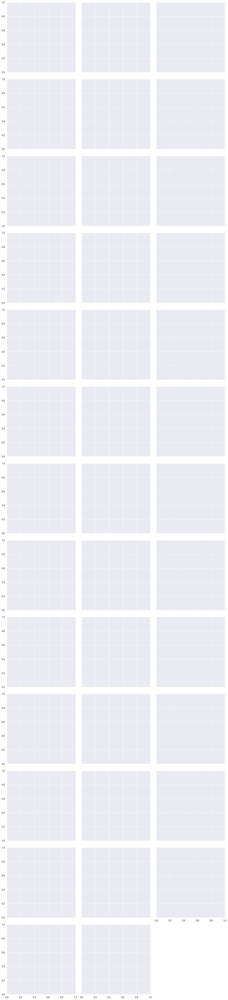

In [ ]:
import seaborn as sns; sns.set(color_codes=True)
g = sns.lmplot(x="Посевная площадь, Га", y="Регион", col="С/х культура", hue="С/х культура",
                data=new_df, col_wrap=3, height=5)

In [ ]:
# В рамках сформированного датасета так же необходимо провести ряд преобразований.
# Представим поля тип хозыйства, регион, с/х культура в числовом виде.
